# UNI2 patch extraction from H&E whole-slide images

extract 256x256 patches at Visium spot coordinates from full-resolution H&E images and compute 1536-d embeddings via UNI2-h (Chen et al. 2024, Nat. Med.). this is the first manual step toward cross-modal contrastive alignment with spatial transcriptomics embeddings (Novae GNN, 256-d) into a shared 512-d space.

the Wang et al. (2024) TNBC dataset provides co-registered Visium ST + H&E on the same tissue sections for 92 patients (281 subarrays). we start with 3-5 patients to learn the pipeline before scaling.

**alignment context:** the system evaluates two integration strategies - late interaction (tiles aggregated per spot via mean/max pooling, then independent MLPs -> shared 512-d, InfoNCE) vs early interaction (tile-level cross-attention between H&E tokens and ST spot before projection, ~4M params, local K tiles). the comparison tests whether tile-level morphological detail lost at aggregation matters for cross-modal alignment quality. this notebook produces the per-tile embeddings that feed both strategies.

**questions this notebook answers:**
- how do spot coordinates in the byArray TSVs map to pixel positions in the HD images?
- what is the physical resolution (um/pixel) of the HD images?
- what patch size produces 256x256 at UNI2's expected 20x (0.5 um/pixel)?
- do embeddings capture meaningful morphological variation across TME compartments?

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image

Image.MAX_IMAGE_PIXELS = None  # HD H&E images are ~31744x31744, legitimately large

ROOT = Path().resolve().parents[1]
DATA = ROOT / 'data' / 'inputs'

sns.set_theme(style='ticks', palette='Dark2', context='notebook')

## 1. map byArray directories to HD images

each subarray in `byArray/{slide}/{position}/` has spot coordinate TSVs. the full-resolution H&E images live in `Images/imagesHD/` named as `TNBC{id}_{slide}_{position}.jpg`. we need a reliable mapping between the two.

In [2]:
# build the mapping from byArray spot data filenames (which contain the TNBC id)
# to the HD image files

by_array = DATA / 'byArray'
hd_dir = DATA / 'Images' / 'imagesHD'

# extract TNBC id from the spot data filename in each subarray dir
# filename pattern: *_{slide}_{position}_TNBC{id}_*
mapping = []
for slide_dir in sorted(by_array.iterdir()):
    if not slide_dir.is_dir():
        continue
    for pos_dir in sorted(slide_dir.iterdir()):
        if not pos_dir.is_dir():
            continue
        spot_files = list(pos_dir.glob('spot_data-selection-*.tsv'))
        if not spot_files:
            continue
        # parse TNBC id from filename
        fname = spot_files[0].name
        # ex: spot_data-selection-190215_CN1_C1_TNBC1_Cy3-Spot000001_small.tsv
        parts = fname.split('_')
        tnbc_id = [p for p in parts if p.startswith('TNBC')][0]
        slide = slide_dir.name
        position = pos_dir.name
        hd_name = f'{tnbc_id}_{slide}_{position}.jpg'
        hd_path = hd_dir / hd_name
        mapping.append({
            'slide': slide,
            'position': position,
            'tnbc_id': tnbc_id,
            'spot_file': spot_files[0],
            'hd_image': hd_path,
            'hd_exists': hd_path.exists(),
        })

mapping_df = pd.DataFrame(mapping)
print(f'subarrays mapped: {len(mapping_df)}')
print(f'HD images found: {mapping_df["hd_exists"].sum()} / {len(mapping_df)}')
missing = mapping_df[~mapping_df['hd_exists']]
if len(missing) > 0:
    print(f'\nmissing HD images:')
    print(missing[['slide', 'position', 'tnbc_id']].to_string(index=False))
else:
    print('all subarrays have matching HD images')
mapping_df.head()

subarrays mapped: 281
HD images found: 279 / 281

missing HD images:
slide position tnbc_id
 CN12       C1  TNBC23
 CN32       D2  TNBC64


,slide,position,tnbc_id,spot_file,hd_image,hd_exists
0,CN1,C1,TNBC1,/Users/sanati/BForePC/omicstra/data/inputs/byA...,/Users/sanati/BForePC/omicstra/data/inputs/Ima...,True
1,CN1,C2,TNBC1,/Users/sanati/BForePC/omicstra/data/inputs/byA...,/Users/sanati/BForePC/omicstra/data/inputs/Ima...,True
2,CN1,D1,TNBC1,/Users/sanati/BForePC/omicstra/data/inputs/byA...,/Users/sanati/BForePC/omicstra/data/inputs/Ima...,True
3,CN1,D2,TNBC2,/Users/sanati/BForePC/omicstra/data/inputs/byA...,/Users/sanati/BForePC/omicstra/data/inputs/Ima...,True
4,CN1,E1,TNBC2,/Users/sanati/BForePC/omicstra/data/inputs/byA...,/Users/sanati/BForePC/omicstra/data/inputs/Ima...,True


## 2. understand the coordinate system

the spot data TSVs have columns `pixel_x`, `pixel_y` - but in which image's coordinate space? each byArray subdir contains:
- `small.jpg` (1190x1190 thumbnail)
- `*_HE-Spot*_small.jpg` (mid-res H&E, ~9523x9523)
- the HD image in `Images/imagesHD/` (31744x31744)

we need to figure out which resolution the pixel coordinates refer to, then compute the scale factor to HD.

In [3]:
# pick one subarray and compare image sizes to pixel coordinate ranges
sample = mapping_df.iloc[0]
sample_dir = by_array / sample['slide'] / sample['position']

# load spot coordinates
spots = pd.read_csv(sample['spot_file'], sep='\t')
print(f'spot coordinate ranges (selection, {len(spots)} spots):')
print(f'  pixel_x: {spots["pixel_x"].min():.1f} - {spots["pixel_x"].max():.1f}')
print(f'  pixel_y: {spots["pixel_y"].min():.1f} - {spots["pixel_y"].max():.1f}')

# check all image sizes in this subarray
print(f'\nimage sizes in {sample["slide"]}/{sample["position"]}:')
thumb = Image.open(sample_dir / 'small.jpg')
print(f'  small.jpg: {thumb.size}')
thumb.close()

he_small = list(sample_dir.glob('*HE*small*'))
if he_small:
    img = Image.open(he_small[0])
    print(f'  {he_small[0].name}: {img.size}')
    img.close()

cy3_small = list(sample_dir.glob('*Cy3*small*.jpg'))
if cy3_small:
    img = Image.open(cy3_small[0])
    print(f'  {cy3_small[0].name}: {img.size}')
    img.close()

hd = Image.open(sample['hd_image'])
print(f'  HD ({sample["hd_image"].name}): {hd.size}')
hd.close()

spot coordinate ranges (selection, 1075 spots):
  pixel_x: 1455.5 - 8268.8
  pixel_y: 1286.9 - 7552.7

image sizes in CN1/C1:
  small.jpg: (1190, 1190)
  190204_Diamond_CN1_C1_TNBC1_HE-Spot000001_small.jpg: (9523, 9523)
  190215_CN1_C1_TNBC1_Cy3-Spot000001_small.jpg: (9523, 9523)
  HD (TNBC1_CN1_C1.jpg): (31744, 31744)


scale factor (small -> HD): 3.3334
a spot at pixel_x=4000 in spot coords -> 13334 in HD


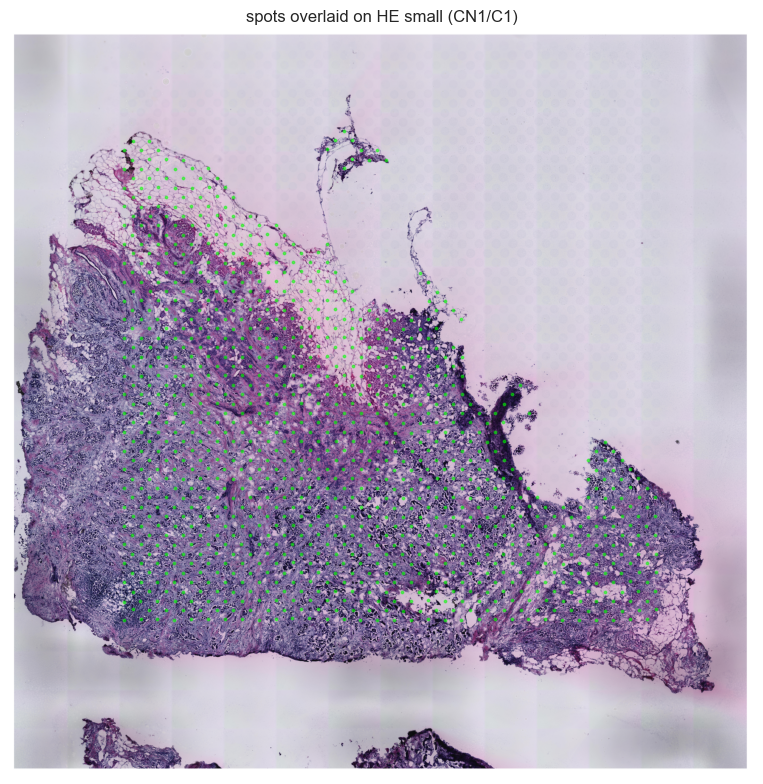

In [4]:
# the pixel coords max out around ~8300, which fits the ~9523x9523 "small" HE/Cy3 images
# (not the 1190x1190 thumbnail, not the 31744x31744 HD)
# scale factor from spot coord space to HD:

he_small_size = 9523  # from the *_HE-Spot*_small.jpg
hd_size = 31744       # from Images/imagesHD/

scale_to_hd = hd_size / he_small_size
print(f'scale factor (small -> HD): {scale_to_hd:.4f}')
print(f'a spot at pixel_x=4000 in spot coords -> {4000 * scale_to_hd:.0f} in HD')

# verify: overlay spots on the small HE image to confirm alignment
fig, ax = plt.subplots(figsize=(8, 8))
he_img = Image.open(he_small[0])
ax.imshow(he_img)
ax.scatter(spots['pixel_x'], spots['pixel_y'], s=3, c='lime', alpha=0.5)
ax.set_title(f'spots overlaid on HE small ({sample["slide"]}/{sample["position"]})')
ax.axis('off')
plt.tight_layout()
plt.show()
he_img.close()

## 3. estimate physical resolution

UNI2 was trained on 256x256 patches at 20x magnification (0.5 um/pixel). we need to know the HD image resolution to extract patches at the correct physical scale.

the ST platform uses 100 um diameter spots with 200 um center-to-center spacing (Wang et al. 2024, p13). we can calibrate resolution from the known spot spacing and observed pixel distances between adjacent spots in the grid.

In [5]:
# load all spots (not just selection) to get the full grid for spacing calculation
all_spot_file = list(sample_dir.glob('spot_data-all-*.tsv'))[0]
all_spots = pd.read_csv(all_spot_file, sep='\t')

# the grid uses integer x,y coords. adjacent spots differ by 2 in one axis
# (the ST array is a staggered grid: even rows offset by 1)
# compute median pixel distance between horizontally adjacent spots

# group by y, sort by x, compute pixel distance to next spot in same row
distances = []
for y_val, group in all_spots.groupby('y'):
    group = group.sort_values('x')
    if len(group) < 2:
        continue
    dx_grid = group['x'].diff().dropna()
    dx_pixel = group['pixel_x'].diff().dropna()
    dy_pixel = group['pixel_y'].diff().dropna()
    pixel_dist = np.sqrt(dx_pixel.values**2 + dy_pixel.values**2)
    grid_dist = dx_grid.values
    for gd, pd_ in zip(grid_dist, pixel_dist):
        if gd == 2:  # adjacent spots are 2 grid units apart
            distances.append(pd_)

median_pixel_dist = np.median(distances)
print(f'median pixel distance between adjacent spots (in small image coords): {median_pixel_dist:.1f} px')

# in HD coords
hd_pixel_dist = median_pixel_dist * scale_to_hd
print(f'median pixel distance between adjacent spots (in HD coords): {hd_pixel_dist:.1f} px')

# the physical distance is 200 um (center-to-center for the ST array)
# but the Wang et al. paper says 100 um diameter, and ST arrays typically have
# center-to-center = 200 um. let's compute both possibilities
for physical_spacing_um in [200, 100]:
    um_per_pixel_hd = physical_spacing_um / hd_pixel_dist
    print(f'\nif center-to-center = {physical_spacing_um} um:')
    print(f'  HD resolution: {um_per_pixel_hd:.4f} um/pixel')
    print(f'  equivalent magnification: ~{0.5 / um_per_pixel_hd:.0f}x (relative to 20x = 0.5 um/px)')
    # at 20x (0.5 um/pixel), 256 px = 128 um
    # at our resolution, how many HD pixels = 128 um?
    patch_px = 128 / um_per_pixel_hd
    print(f'  to get 128 um FOV (256px at 20x): extract {patch_px:.0f}x{patch_px:.0f} px from HD, resize to 256x256')

median pixel distance between adjacent spots (in small image coords): 216.3 px
median pixel distance between adjacent spots (in HD coords): 721.0 px

if center-to-center = 200 um:
  HD resolution: 0.2774 um/pixel
  equivalent magnification: ~2x (relative to 20x = 0.5 um/px)
  to get 128 um FOV (256px at 20x): extract 461x461 px from HD, resize to 256x256

if center-to-center = 100 um:
  HD resolution: 0.1387 um/pixel
  equivalent magnification: ~4x (relative to 20x = 0.5 um/px)
  to get 128 um FOV (256px at 20x): extract 923x923 px from HD, resize to 256x256


In [6]:
# decision: set the physical spacing based on the output above.
# the ST platform (pre-Visium, Spatial Transcriptomics AB) uses 200 um center-to-center.
# UPDATE THIS after running the cell above if the numbers suggest otherwise.

SPOT_SPACING_UM = 200  # center-to-center, um
UM_PER_PIXEL_HD = SPOT_SPACING_UM / hd_pixel_dist

# for UNI2: 256x256 at 0.5 um/pixel = 128x128 um field of view
UNI2_FOV_UM = 128
PATCH_SIZE_HD = int(round(UNI2_FOV_UM / UM_PER_PIXEL_HD))
UNI2_INPUT_SIZE = 256

print(f'calibrated HD resolution: {UM_PER_PIXEL_HD:.4f} um/pixel')
print(f'patch extraction size from HD: {PATCH_SIZE_HD}x{PATCH_SIZE_HD} px')
print(f'resize to: {UNI2_INPUT_SIZE}x{UNI2_INPUT_SIZE} px for UNI2')
print(f'effective magnification of HD images: ~{0.5 / UM_PER_PIXEL_HD:.1f}x')

calibrated HD resolution: 0.2774 um/pixel
patch extraction size from HD: 461x461 px
resize to: 256x256 px for UNI2
effective magnification of HD images: ~1.8x


## 4. extract patches from one subarray

load the HD image, scale spot coordinates, extract patches centered at each spot. we crop `PATCH_SIZE_HD x PATCH_SIZE_HD` from the HD image and resize to 256x256 for UNI2.

spots near the image border get zero-padded rather than skipped - this preserves the 1:1 spot-to-patch correspondence needed for alignment with ST embeddings.

In [7]:
def extract_patches(hd_image_path, spot_df, scale_factor, patch_size_hd, output_size=256):
    """extract patches centered at spot coordinates from an HD H&E image.

    args:
        hd_image_path: path to full-resolution H&E image
        spot_df: dataframe with pixel_x, pixel_y columns (in small image coords)
        scale_factor: multiply spot coords by this to get HD pixel coords
        patch_size_hd: crop size in HD pixels
        output_size: resize target (256 for UNI2)

    returns:
        list of PIL images (output_size x output_size), list of (cx, cy) HD coords
    """
    img = Image.open(hd_image_path)
    w, h = img.size
    half = patch_size_hd // 2
    patches = []
    coords = []

    for _, row in spot_df.iterrows():
        cx = int(round(row['pixel_x'] * scale_factor))
        cy = int(round(row['pixel_y'] * scale_factor))

        # crop box (left, upper, right, lower) - clamp to image bounds
        x1 = max(0, cx - half)
        y1 = max(0, cy - half)
        x2 = min(w, cx + half)
        y2 = min(h, cy + half)

        patch = img.crop((x1, y1, x2, y2))

        # zero-pad if we hit the border
        if patch.size != (patch_size_hd, patch_size_hd):
            padded = Image.new('RGB', (patch_size_hd, patch_size_hd), (0, 0, 0))
            paste_x = half - (cx - x1)
            paste_y = half - (cy - y1)
            padded.paste(patch, (paste_x, paste_y))
            patch = padded

        patch = patch.resize((output_size, output_size), Image.LANCZOS)
        patches.append(patch)
        coords.append((cx, cy))

    img.close()
    return patches, coords

In [8]:
%%time
# extract patches for the sample subarray
patches, hd_coords = extract_patches(
    sample['hd_image'], spots, scale_to_hd, PATCH_SIZE_HD, UNI2_INPUT_SIZE
)
print(f'extracted {len(patches)} patches from {sample["tnbc_id"]} ({sample["slide"]}/{sample["position"]})')
print(f'patch size: {patches[0].size}')

extracted 1075 patches from TNBC1 (CN1/C1)
patch size: (256, 256)
CPU times: user 3.54 s, sys: 389 ms, total: 3.93 s
Wall time: 3.93 s


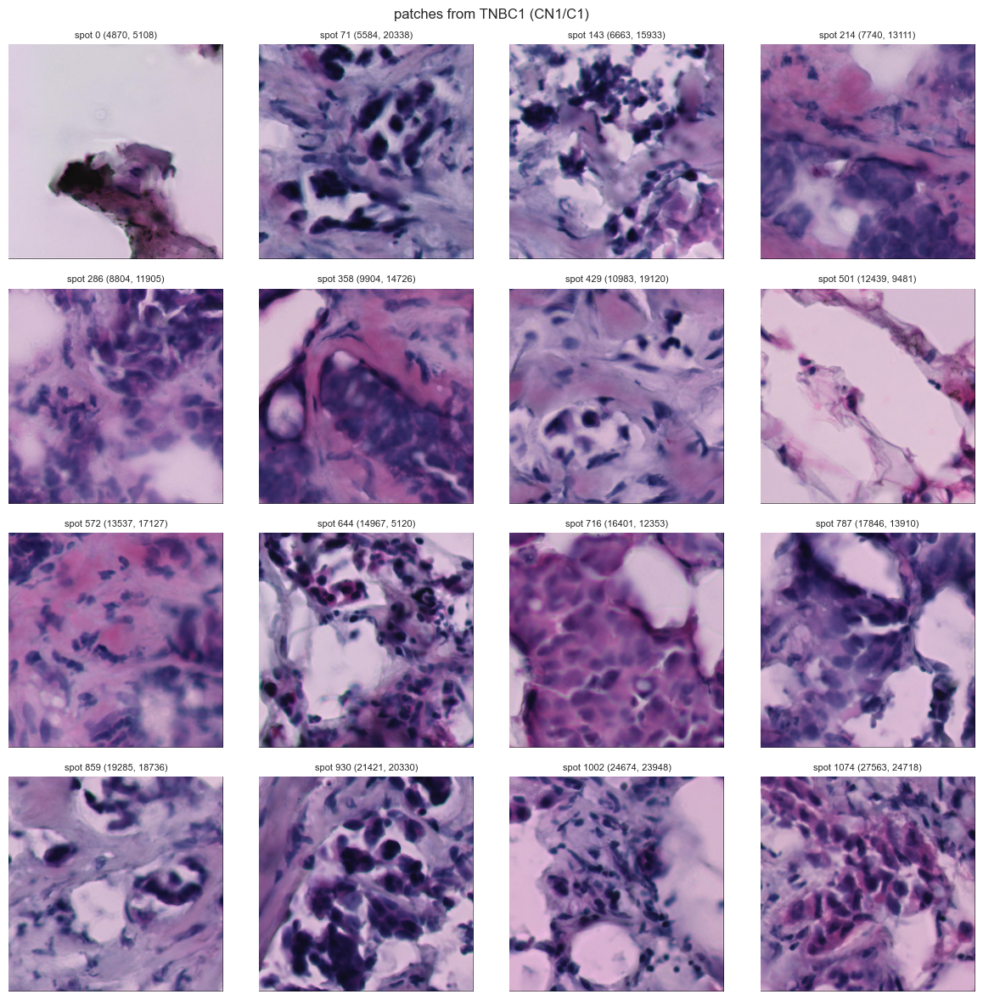

In [9]:
# visualize a grid of patches - sample from different spatial regions
n_show = 16
indices = np.linspace(0, len(patches) - 1, n_show, dtype=int)

fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for ax, idx in zip(axes.flat, indices):
    ax.imshow(patches[idx])
    cx, cy = hd_coords[idx]
    ax.set_title(f'spot {idx} ({cx}, {cy})', fontsize=8)
    ax.axis('off')
plt.suptitle(f'patches from {sample["tnbc_id"]} ({sample["slide"]}/{sample["position"]})', fontsize=12)
plt.tight_layout()
plt.show()

## 5. patch quality check

before running UNI2, verify patches look reasonable:
- do they contain actual tissue (not background)?
- is the staining quality consistent?
- are there obvious artifacts (pen marks, folds, blur)?

a simple tissue detection heuristic: convert to grayscale, threshold. tissue is darker than background.

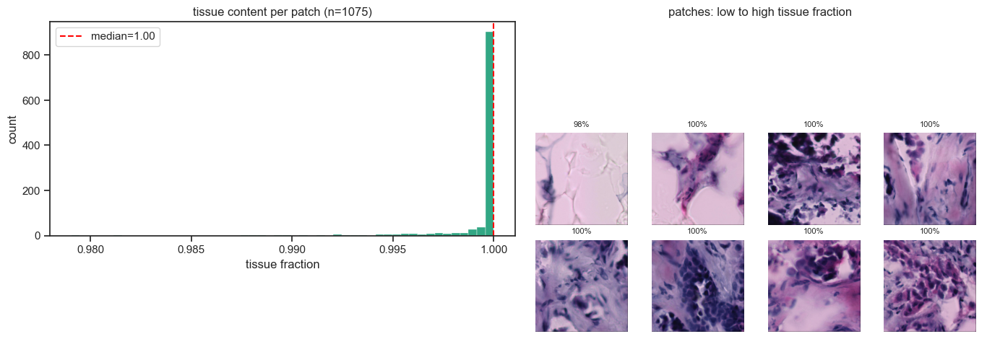

tissue fraction: min=98%, median=100%, max=100%
patches with >50% tissue: 1075 / 1075
selection spots are already tissue-filtered - high tissue fractions expected


In [10]:
# tissue fraction per patch: fraction of pixels below grayscale threshold
tissue_fractions = []
for p in patches:
    gray = np.array(p.convert('L'))
    tissue_frac = (gray < 220).mean()
    tissue_fractions.append(tissue_frac)

tissue_fractions = np.array(tissue_fractions)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# left: histogram zoomed to actual data range
axes[0].hist(tissue_fractions, bins=50, edgecolor='white', linewidth=0.3, alpha=0.9)
axes[0].set_xlabel('tissue fraction')
axes[0].set_ylabel('count')
axes[0].set_title(f'tissue content per patch (n={len(patches)})')
axes[0].axvline(tissue_fractions.median() if hasattr(tissue_fractions, 'median') else np.median(tissue_fractions),
               color='red', ls='--', label=f'median={np.median(tissue_fractions):.2f}')
axes[0].legend()

# right: sample patches from lowest to highest tissue fraction
sorted_idx = np.argsort(tissue_fractions)
sample_idx = sorted_idx[np.linspace(0, len(sorted_idx)-1, 8, dtype=int)]

for i, idx in enumerate(sample_idx):
    row, col = divmod(i, 4)
    ax_inset = axes[1].inset_axes([col * 0.25, (1 - row) * 0.5 - 0.45, 0.23, 0.43])
    ax_inset.imshow(patches[idx])
    ax_inset.set_title(f'{tissue_fractions[idx]:.0%}', fontsize=8)
    ax_inset.axis('off')

axes[1].set_title('patches: low to high tissue fraction')
axes[1].axis('off')
plt.tight_layout()
plt.show()

print(f'tissue fraction: min={tissue_fractions.min():.0%}, median={np.median(tissue_fractions):.0%}, max={tissue_fractions.max():.0%}')
print(f'patches with >50% tissue: {(tissue_fractions > 0.5).sum()} / {len(patches)}')
print(f'selection spots are already tissue-filtered - high tissue fractions expected')


## 6. scale to multiple patients

extract patches for 5 subarrays across different patients. this tests whether the coordinate mapping and patch extraction generalize beyond the first example, and gives us enough morphological diversity for embedding analysis.

In [11]:
%%time
# pick 5 subarrays from different patients (different TNBC ids)
available = mapping_df[mapping_df['hd_exists']].copy()
unique_patients = available.drop_duplicates(subset='tnbc_id')
selected = unique_patients.sample(n=5, random_state=42)

print('selected subarrays:')
print(selected[['tnbc_id', 'slide', 'position']].to_string(index=False))

all_patches = {}
all_hd_coords = {}

for _, row in selected.iterrows():
    key = f'{row["tnbc_id"]}_{row["slide"]}_{row["position"]}'
    spot_df = pd.read_csv(row['spot_file'], sep='\t')

    # verify scale factor for this subarray (images may differ in size)
    sub_dir = by_array / row['slide'] / row['position']
    he_smalls = list(sub_dir.glob('*HE*small*'))
    if he_smalls:
        he_s = Image.open(he_smalls[0])
        he_small_w = he_s.size[0]
        he_s.close()
    else:
        he_small_w = he_small_size  # fallback to first sample

    hd_img = Image.open(row['hd_image'])
    hd_w = hd_img.size[0]
    hd_img.close()

    sf = hd_w / he_small_w
    p, c = extract_patches(row['hd_image'], spot_df, sf, PATCH_SIZE_HD, UNI2_INPUT_SIZE)
    all_patches[key] = p
    all_hd_coords[key] = c
    print(f'  {key}: {len(p)} patches (scale factor {sf:.4f})')

total = sum(len(v) for v in all_patches.values())
print(f'\ntotal patches: {total}')

selected subarrays:
tnbc_id slide position
 TNBC55  CN28       C1
  TNBC3   CN2       C1
 TNBC68  CN34       D2
 TNBC83  CN42       C1
  TNBC1   CN1       C1
  TNBC55_CN28_C1: 583 patches (scale factor 3.3334)
  TNBC3_CN2_C1: 701 patches (scale factor 3.3334)
  TNBC68_CN34_D2: 717 patches (scale factor 3.3334)
  TNBC83_CN42_C1: 1438 patches (scale factor 3.3334)
  TNBC1_CN1_C1: 1075 patches (scale factor 3.3334)

total patches: 4514
CPU times: user 15.9 s, sys: 1.6 s, total: 17.5 s
Wall time: 17.5 s


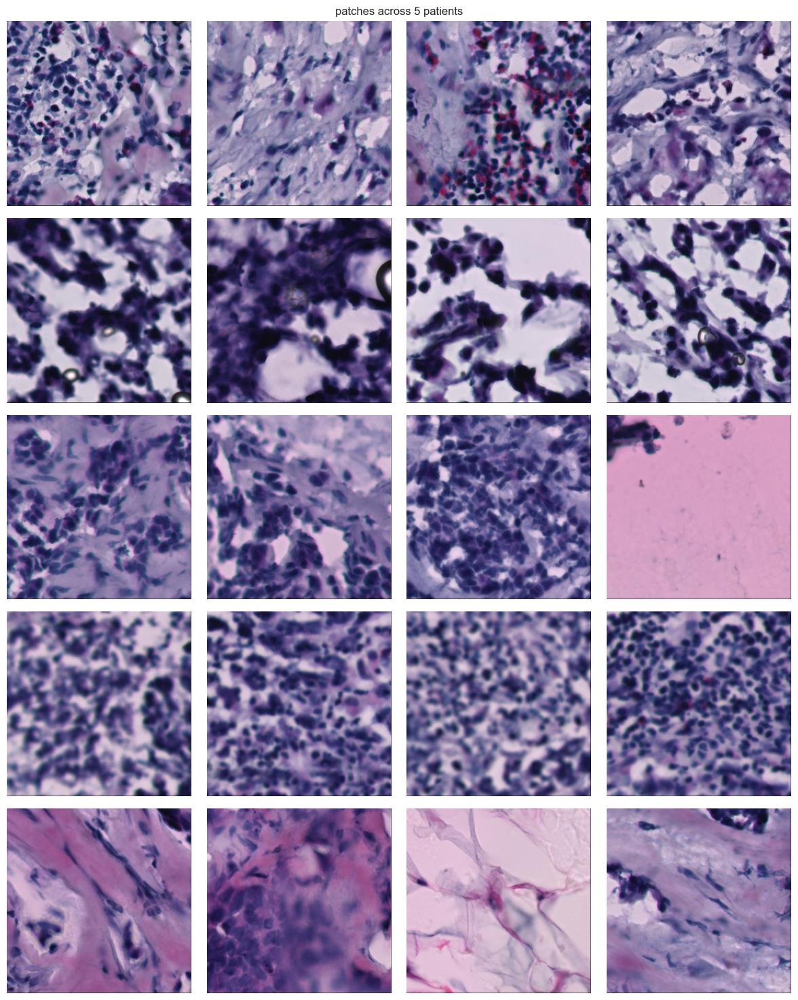

In [12]:
# visual comparison across patients - 4 random patches per subarray
fig, axes = plt.subplots(5, 4, figsize=(12, 15))
for i, (key, plist) in enumerate(all_patches.items()):
    sample_idx = np.random.RandomState(42).choice(len(plist), size=4, replace=False)
    for j, idx in enumerate(sample_idx):
        axes[i, j].imshow(plist[idx])
        axes[i, j].axis('off')
    axes[i, 0].set_ylabel(key, fontsize=8, rotation=0, labelpad=80, va='center')
plt.suptitle('patches across 5 patients', fontsize=12)
plt.tight_layout()
plt.show()

## 7. install UNI2 dependencies

UNI2-h requires `torch`, `timm`, and `huggingface_hub`. the model is a ViT-H/14 (632M params) trained on >200M pathology images (Chen et al. 2024). it produces 1536-d embeddings per 256x256 tile.

**note:** UNI2 requires a HuggingFace access token with approval from the model authors. see https://huggingface.co/MahmoodLab/UNI2-h for access request.

In [13]:
# install if needed - skip if already installed
import subprocess, sys

def install_if_missing(package, pip_name=None):
    try:
        __import__(package)
        print(f'{package}: already installed')
    except ImportError:
        pip_name = pip_name or package
        print(f'installing {pip_name}...')
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', pip_name])
        print(f'{pip_name}: installed')

install_if_missing('torch', 'torch')
install_if_missing('timm', 'timm')
install_if_missing('huggingface_hub', 'huggingface_hub')

torch: already installed
timm: already installed
huggingface_hub: already installed


In [14]:
import torch
import timm
from torchvision import transforms

device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(f'device: {device}')
print(f'torch: {torch.__version__}')
print(f'timm: {timm.__version__}')

device: mps
torch: 2.11.0
timm: 1.0.26


## 8. load UNI2-h

load the pretrained ViT-H/14 from HuggingFace. the model outputs a 1536-d CLS token embedding for each 256x256 input tile. we use the standard ImageNet normalization that UNI2 expects.

In [15]:
# load UNI2-h from HuggingFace
# architecture params from https://huggingface.co/MahmoodLab/UNI2-h

timm_kwargs = {
  'img_size': 224,
  'patch_size': 14,
  'depth': 24,
  'num_heads': 24,
  'init_values': 1e-5,
  'embed_dim': 1536,
  'mlp_ratio': 2.66667 * 2,
  'num_classes': 0,
  'no_embed_class': True,
  'mlp_layer': timm.layers.SwiGLUPacked,
  'act_layer': torch.nn.SiLU,
  'reg_tokens': 8,
  'dynamic_img_size': True,
}

model = timm.create_model('hf-hub:MahmoodLab/UNI2-h', pretrained=True, **timm_kwargs)

from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
uni2_transform = create_transform(**resolve_data_config(model.pretrained_cfg, model=model))

model = model.to(device)
model.eval()

with torch.no_grad():
  dummy = torch.randn(1, 3, 224, 224).to(device)
  out = model(dummy)
  print(f'UNI2-h output shape: {out.shape}')

n_params = sum(p.numel() for p in model.parameters())
print(f'parameters: {n_params / 1e6:.0f}M')


UNI2-h output shape: torch.Size([1, 1536])
parameters: 681M


## 9. compute embeddings

run inference on all extracted patches. batch processing for efficiency. on Apple Silicon (MPS), expect ~50-100 patches/sec for ViT-H/14.

In [16]:
def embed_patches(patch_list, model, transform, device, batch_size=32):
    """compute UNI2 embeddings for a list of PIL patches.

    returns: numpy array of shape (n_patches, 1536)
    """
    embeddings = []
    n = len(patch_list)

    for i in range(0, n, batch_size):
        batch_pil = patch_list[i:i + batch_size]
        batch_tensors = torch.stack([transform(p) for p in batch_pil]).to(device)

        with torch.no_grad():
            emb = model(batch_tensors)

        embeddings.append(emb.cpu().numpy())

        if (i + batch_size) % (batch_size * 10) == 0 or i + batch_size >= n:
            print(f'  {min(i + batch_size, n)}/{n} patches embedded', end='\r')

    print()
    return np.vstack(embeddings)

In [17]:
%%time
# embed all patches across the 5 selected subarrays
all_embeddings = {}
for key, plist in all_patches.items():
    print(f'{key}:')
    emb = embed_patches(plist, model, uni2_transform, device, batch_size=32)
    all_embeddings[key] = emb
    print(f'  shape: {emb.shape}')

# combine into a single matrix with labels
emb_list = []
label_list = []
for key, emb in all_embeddings.items():
    emb_list.append(emb)
    label_list.extend([key] * len(emb))

embeddings_all = np.vstack(emb_list)
labels_all = np.array(label_list)
print(f'\ncombined: {embeddings_all.shape} ({len(np.unique(labels_all))} subarrays)')

TNBC55_CN28_C1:
  583/583 patches embedded
  shape: (583, 1536)
TNBC3_CN2_C1:
  701/701 patches embedded
  shape: (701, 1536)
TNBC68_CN34_D2:
  717/717 patches embedded
  shape: (717, 1536)
TNBC83_CN42_C1:
  1438/1438 patches embedded
  shape: (1438, 1536)
TNBC1_CN1_C1:
  1075/1075 patches embedded
  shape: (1075, 1536)

combined: (4514, 1536) (5 subarrays)
CPU times: user 6.42 s, sys: 9.44 s, total: 15.9 s
Wall time: 5min 36s


## 10. embedding quality assessment

three checks to determine whether UNI2 produces useful representations on this tissue:

1. **collapse check** - are all embeddings the same? (cosine similarity distribution should be spread, not peaked at 1.0)
2. **patient separation** - do embeddings from different patients separate in UMAP? (some separation expected due to biological + technical variation)
3. **within-patient structure** - do spatially nearby spots have more similar embeddings? (morphological autocorrelation should produce spatial structure)

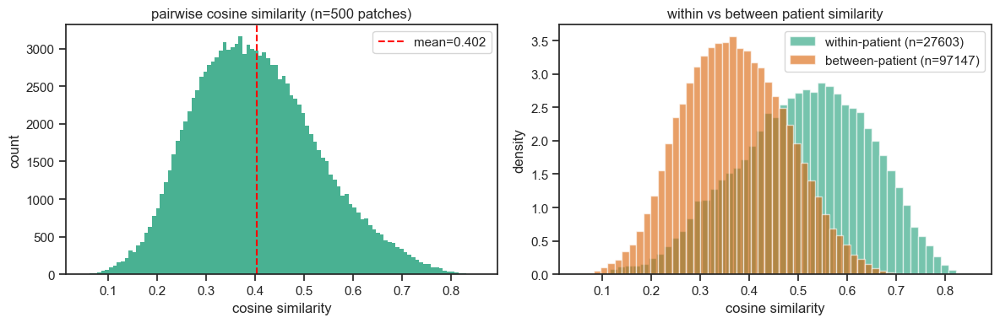

within-patient mean cosine sim: 0.510 +/- 0.133
between-patient mean cosine sim: 0.372 +/- 0.105
separation: 0.138


In [18]:
from sklearn.metrics.pairwise import cosine_similarity

# 1. collapse check: pairwise cosine similarity on a random subset
rng = np.random.RandomState(42)
subset_idx = rng.choice(len(embeddings_all), size=min(500, len(embeddings_all)), replace=False)
cos_sim = cosine_similarity(embeddings_all[subset_idx])

# upper triangle only (exclude diagonal)
triu_idx = np.triu_indices(len(subset_idx), k=1)
sim_values = cos_sim[triu_idx]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(sim_values, bins=100, edgecolor='none', alpha=0.8)
axes[0].set_xlabel('cosine similarity')
axes[0].set_ylabel('count')
axes[0].set_title(f'pairwise cosine similarity (n={len(subset_idx)} patches)')
axes[0].axvline(sim_values.mean(), color='red', ls='--', label=f'mean={sim_values.mean():.3f}')
axes[0].legend()

# 2. within-patient vs between-patient similarity
within = []
between = []
sub_labels = labels_all[subset_idx]
for i in range(len(subset_idx)):
    for j in range(i + 1, len(subset_idx)):
        if sub_labels[i] == sub_labels[j]:
            within.append(cos_sim[i, j])
        else:
            between.append(cos_sim[i, j])

axes[1].hist(within, bins=50, alpha=0.6, label=f'within-patient (n={len(within)})', density=True)
axes[1].hist(between, bins=50, alpha=0.6, label=f'between-patient (n={len(between)})', density=True)
axes[1].set_xlabel('cosine similarity')
axes[1].set_ylabel('density')
axes[1].set_title('within vs between patient similarity')
axes[1].legend()

plt.tight_layout()
plt.show()

print(f'within-patient mean cosine sim: {np.mean(within):.3f} +/- {np.std(within):.3f}')
print(f'between-patient mean cosine sim: {np.mean(between):.3f} +/- {np.std(between):.3f}')
print(f'separation: {np.mean(within) - np.mean(between):.3f}')

PCA variance explained (50 components): 65.95%


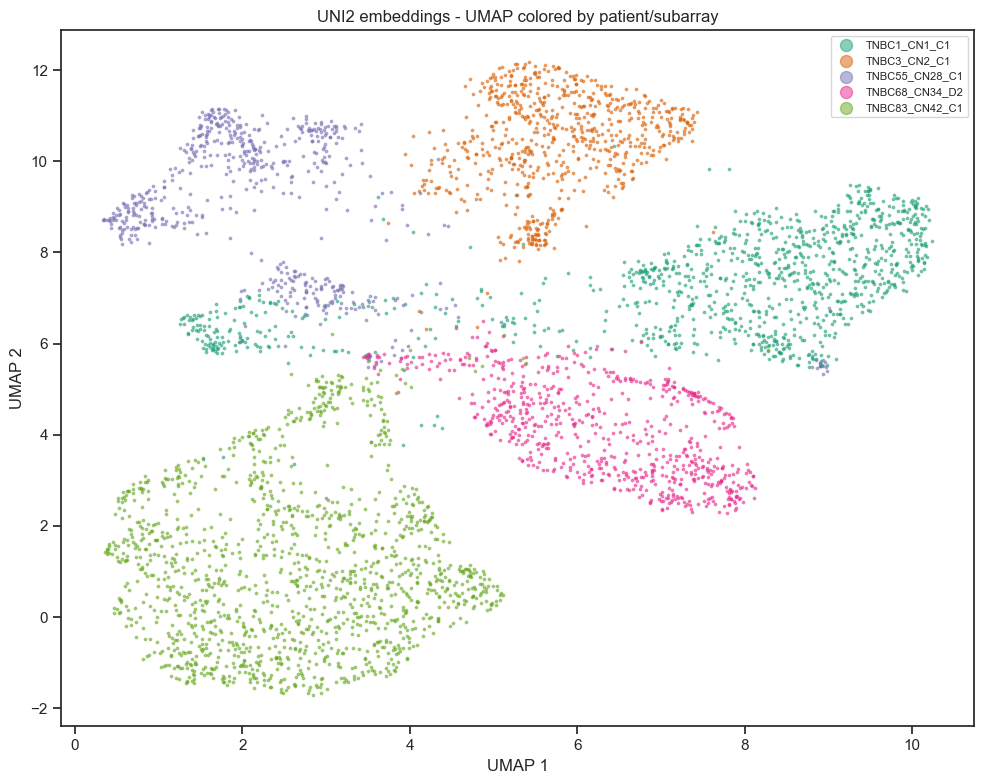

In [19]:
# 3. UMAP of all embeddings colored by patient
import warnings
warnings.filterwarnings('ignore', message='.*n_jobs.*')
from sklearn.decomposition import PCA
try:
    import umap
except ImportError:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', 'umap-learn'])
    import umap

# PCA to 50d first (standard practice for UMAP on high-d data)
pca = PCA(n_components=50, random_state=42)
emb_pca = pca.fit_transform(embeddings_all)
print(f'PCA variance explained (50 components): {pca.explained_variance_ratio_.sum():.2%}')

reducer = umap.UMAP(n_neighbors=30, min_dist=0.3, random_state=42)
emb_umap = reducer.fit_transform(emb_pca)

fig, ax = plt.subplots(figsize=(10, 8))
unique_labels = np.unique(labels_all)
for label in unique_labels:
    mask = labels_all == label
    ax.scatter(emb_umap[mask, 0], emb_umap[mask, 1], s=3, alpha=0.5, label=label)
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_title('UNI2 embeddings - UMAP colored by patient/subarray')
ax.legend(markerscale=5, fontsize=8)
plt.tight_layout()
plt.show()


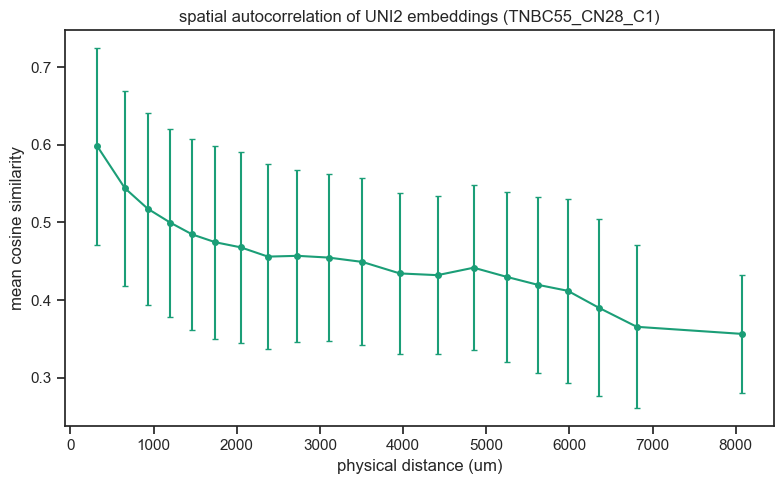

Spearman correlation (distance vs similarity): rho=-0.413, p=0.00e+00
negative rho = nearby spots are more similar (expected for spatially structured tissue)


In [20]:
# 4. spatial autocorrelation: do nearby spots have similar embeddings?
# for one subarray, compute cosine similarity vs physical distance between spots

sample_key = list(all_embeddings.keys())[0]
sample_emb = all_embeddings[sample_key]
sample_coords = np.array(all_hd_coords[sample_key])

# pairwise physical distance (euclidean in HD pixel space)
from scipy.spatial.distance import pdist, squareform

n_sample = min(300, len(sample_emb))  # subsample for speed
idx = rng.choice(len(sample_emb), size=n_sample, replace=False)

phys_dist = squareform(pdist(sample_coords[idx]))
emb_sim = cosine_similarity(sample_emb[idx])

# flatten upper triangle
triu = np.triu_indices(n_sample, k=1)
dists = phys_dist[triu]
sims = emb_sim[triu]

# bin by distance and plot mean similarity per bin
n_bins = 20
bins = np.percentile(dists, np.linspace(0, 100, n_bins + 1))
bin_centers = []
bin_means = []
bin_stds = []
for i in range(n_bins):
    mask = (dists >= bins[i]) & (dists < bins[i + 1])
    if mask.sum() > 0:
        bin_centers.append((bins[i] + bins[i + 1]) / 2)
        bin_means.append(sims[mask].mean())
        bin_stds.append(sims[mask].std())

fig, ax = plt.subplots(figsize=(8, 5))
ax.errorbar(np.array(bin_centers) * UM_PER_PIXEL_HD, bin_means, yerr=bin_stds,
            fmt='o-', markersize=4, capsize=2)
ax.set_xlabel('physical distance (um)')
ax.set_ylabel('mean cosine similarity')
ax.set_title(f'spatial autocorrelation of UNI2 embeddings ({sample_key})')
plt.tight_layout()
plt.show()

from scipy.stats import spearmanr
rho, pval = spearmanr(dists, sims)
print(f'Spearman correlation (distance vs similarity): rho={rho:.3f}, p={pval:.2e}')
print(f'negative rho = nearby spots are more similar (expected for spatially structured tissue)')

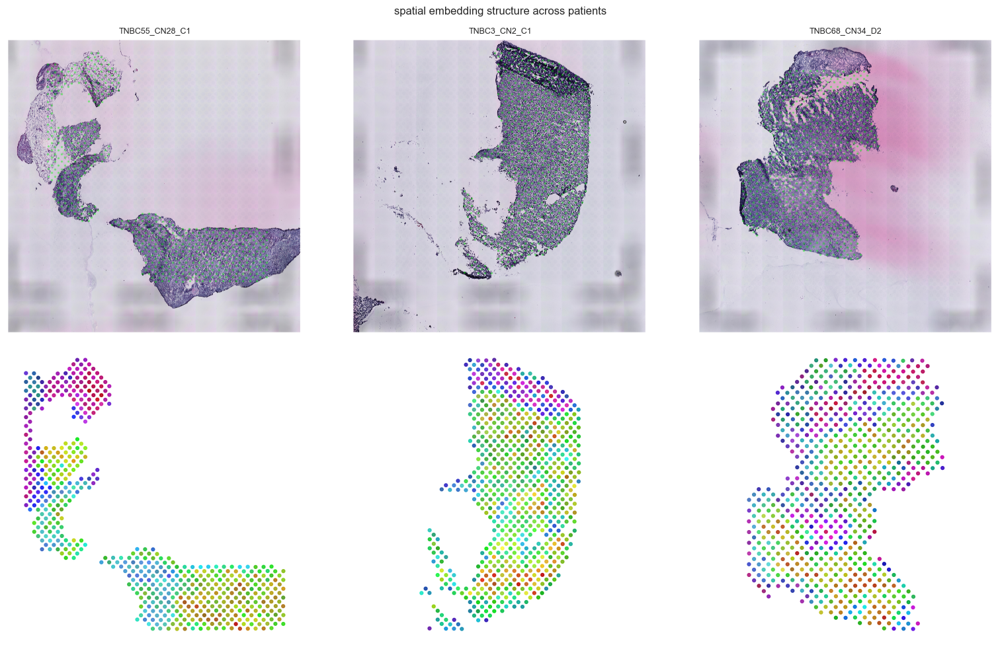

similar colors in nearby spots = UNI2 captures spatially coherent morphology
distinct color regions = different tissue compartments (tumor, stroma, immune)


In [21]:
# 5. spatial embedding map: PCA components as RGB at physical spot locations
# shows whether UNI2 captures spatially coherent morphological regions

from matplotlib.colors import hsv_to_rgb

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

for col_idx, (key, emb) in enumerate(list(all_embeddings.items())[:3]):
    row_info = selected[selected.apply(
        lambda r: f'{r["tnbc_id"]}_{r["slide"]}_{r["position"]}' == key, axis=1
    )].iloc[0]
    spot_df = pd.read_csv(row_info['spot_file'], sep='\t')
    sub_dir = by_array / row_info['slide'] / row_info['position']

    # top row: H&E with spots
    he_smalls = list(sub_dir.glob('*HE*small*'))
    if he_smalls:
        he_thumb = Image.open(he_smalls[0])
        axes[0, col_idx].imshow(he_thumb)
        axes[0, col_idx].scatter(spot_df['pixel_x'], spot_df['pixel_y'],
                                 s=2, c='lime', alpha=0.3)
        he_thumb.close()
    axes[0, col_idx].set_title(key, fontsize=9)
    axes[0, col_idx].axis('off')

    # bottom row: map PCA to HSV for more distinguishable colors
    # PC1 -> hue (full color wheel), PC2 -> saturation, PC3 -> value
    pca3 = PCA(n_components=3, random_state=42)
    emb_pca = pca3.fit_transform(emb)
    emb_norm = (emb_pca - emb_pca.min(axis=0)) / (emb_pca.max(axis=0) - emb_pca.min(axis=0))

    hsv = np.stack([
        emb_norm[:, 0],             # hue: full 0-1 range
        0.6 + 0.4 * emb_norm[:, 1], # saturation: 0.6-1.0 (always vivid)
        0.5 + 0.5 * emb_norm[:, 2], # value: 0.5-1.0 (never too dark)
    ], axis=-1)
    colors = hsv_to_rgb(hsv)

    axes[1, col_idx].scatter(
        spot_df['pixel_x'], spot_df['pixel_y'],
        c=colors, s=12, alpha=0.9
    )
    axes[1, col_idx].set_aspect('equal')
    axes[1, col_idx].invert_yaxis()
    axes[1, col_idx].set_facecolor('#1a1a1a')
    axes[1, col_idx].axis('off')

axes[0, 0].set_ylabel('H&E', fontsize=10)
axes[1, 0].set_ylabel('UNI2 PCA (HSV)', fontsize=10)
fig.suptitle('spatial embedding structure across patients', fontsize=12)
plt.tight_layout()
plt.show()

print('similar colors in nearby spots = UNI2 captures spatially coherent morphology')
print('distinct color regions = different tissue compartments (tumor, stroma, immune)')

## 11. embedding validation against morphological annotations

the dataset includes expert pathologist annotations per spot (annotBySpot.RDS) - 17 tissue categories with pixel fractions.
3 of our 5 selected subarrays have annotations (CN1/C1, CN2/C1, CN34/D2).
if UNI2 captures morphology, spots with the same dominant tissue type should cluster together.

side-by-side: UMAP colored by patient (left) vs dominant morphological category (right).
"Nothing" spots (non-annotated background) are excluded from the morphology panel.


  TNBC55_CN28_C1: no annotBySpot.RDS - skipping
  TNBC3_CN2_C1: 701/701 spots matched annotations
  TNBC68_CN34_D2: 697/717 spots matched annotations
  TNBC83_CN42_C1: no annotBySpot.RDS - skipping
  TNBC1_CN1_C1: 1075/1075 spots matched annotations

spots with tissue annotations: 1956 / 4514
category breakdown:
Tumor               852
Acellular stroma    688
Stroma cell         216
Fat tissue          171
High TIL stroma      11
Lymphocyte           10
Lactiferous duct      6
Low TIL stroma        2


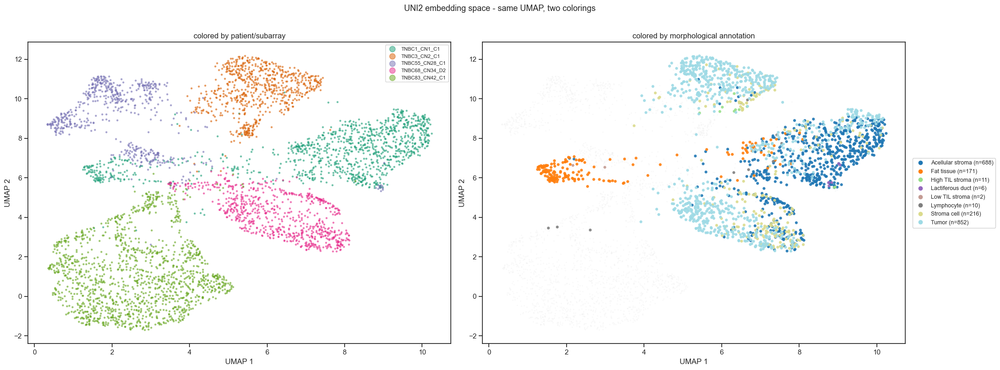


silhouette score (cosine, all tissue categories): 0.008
> 0 = categories cluster | ~ 0 = overlapping | < 0 = mixed
note: unreliable given class imbalance (n=2 to n=852)

silhouette score (Tumor n=852 vs Acellular stroma n=688): 0.105
this pairwise comparison is more statistically valid given balanced class sizes


In [31]:
import io
from matplotlib.lines import Line2D

# build annotation labels aligned to the full embedding matrix
morph_labels_full = np.array([''] * len(embeddings_all), dtype=object)
offset = 0
for key, emb in all_embeddings.items():
    n = len(emb)
    row_match = selected[selected.apply(
        lambda r: f'{r["tnbc_id"]}_{r["slide"]}_{r["position"]}' == key, axis=1
    )]
    if len(row_match) == 0:
        offset += n
        continue
    row_info = row_match.iloc[0]
    annot_path = by_array / row_info['slide'] / row_info['position'] / 'annotBySpot.RDS'
    if not annot_path.exists():
        print(f'  {key}: no annotBySpot.RDS - skipping')
        offset += n
        continue

    r = subprocess.run(
        ['Rscript', '-e', f'x <- readRDS("{annot_path}"); write.csv(x, stdout())'],
        capture_output=True, text=True
    )
    annot_df = pd.read_csv(io.StringIO(r.stdout), index_col=0)
    spot_df = pd.read_csv(row_info['spot_file'], sep='\t')
    spot_df['spot_id'] = spot_df['x'].astype(str) + 'x' + spot_df['y'].astype(str)

    matched = 0
    for j, sid in enumerate(spot_df['spot_id']):
        if sid in annot_df.index:
            morph_labels_full[offset + j] = annot_df.loc[sid].idxmax()
            matched += 1
    print(f'  {key}: {matched}/{n} spots matched annotations')
    offset += n

# exclude non-tissue categories
skip_cats = {'Nothing', 'Hole (whitespace)', 'Artefacts', ''}
has_label = np.array([m not in skip_cats for m in morph_labels_full])
print(f'\nspots with tissue annotations: {has_label.sum()} / {len(morph_labels_full)}')
print('category breakdown:')
print(pd.Series(morph_labels_full[has_label]).value_counts().to_string())

# assign each category an integer, then use tab20 colormap
unique_cats = sorted(pd.Series(morph_labels_full[has_label]).unique())
cat_to_int = {cat: i for i, cat in enumerate(unique_cats)}
cmap = plt.colormaps['tab20'].resampled(len(unique_cats))

fig, axes = plt.subplots(1, 2, figsize=(22, 8))

# left panel: UMAP by patient
unique_labels = np.unique(labels_all)
for label in unique_labels:
    mask = labels_all == label
    axes[0].scatter(emb_umap[mask, 0], emb_umap[mask, 1], s=5, alpha=0.5, label=label)
axes[0].set_xlabel('UMAP 1')
axes[0].set_ylabel('UMAP 2')
axes[0].set_title('colored by patient/subarray')
axes[0].legend(markerscale=4, fontsize=8, loc='best')

# right panel: gray background
axes[1].scatter(emb_umap[~has_label, 0], emb_umap[~has_label, 1],
               s=2, c='#e0e0e0', alpha=0.1, rasterized=True, zorder=1)

# plot each category separately using cmap colors
cat_counts = pd.Series(morph_labels_full[has_label]).value_counts()
legend_handles = []
for cat in unique_cats:
    mask = morph_labels_full == cat
    rgba = cmap(cat_to_int[cat])
    n = mask.sum()
    axes[1].scatter(emb_umap[mask, 0], emb_umap[mask, 1],
                   s=20, facecolors=[rgba] * n, alpha=0.9,
                   edgecolors='none', zorder=2)
    legend_handles.append(Line2D([0], [0], marker='o', color='w',
                                 markerfacecolor=rgba, markersize=8,
                                 label=f'{cat} (n={n})'))

axes[1].legend(handles=legend_handles, fontsize=9, loc='center left',
              bbox_to_anchor=(1.01, 0.5), ncol=1,
              facecolor='white', framealpha=0.9)
axes[1].set_xlabel('UMAP 1')
axes[1].set_ylabel('UMAP 2')
axes[1].set_title('colored by morphological annotation')

fig.suptitle('UNI2 embedding space - same UMAP, two colorings', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

# silhouette score - all categories
from sklearn.metrics import silhouette_score
if len(unique_cats) > 1:
    sil = silhouette_score(
        embeddings_all[has_label], morph_labels_full[has_label],
        metric='cosine', sample_size=min(5000, has_label.sum())
    )
    print(f'\nsilhouette score (cosine, all tissue categories): {sil:.3f}')
    print('> 0 = categories cluster | ~ 0 = overlapping | < 0 = mixed')
    print(f'note: unreliable given class imbalance (n=2 to n=852)')

# pairwise silhouette on the two dominant categories only
top2 = ['Tumor', 'Acellular stroma']
top2_mask = np.isin(morph_labels_full, top2)
if top2_mask.sum() > 0:
    sil_top2 = silhouette_score(
        embeddings_all[top2_mask], morph_labels_full[top2_mask],
        metric='cosine'
    )
    n_tumor = (morph_labels_full[top2_mask] == 'Tumor').sum()
    n_stroma = (morph_labels_full[top2_mask] == 'Acellular stroma').sum()
    print(f'\nsilhouette score (Tumor n={n_tumor} vs Acellular stroma n={n_stroma}): {sil_top2:.3f}')
    print('this pairwise comparison is more statistically valid given balanced class sizes')

---

## summary

### pipeline
- spot coordinates in byArray TSVs are in the 9523x9523 HE-small image space
- scale factor to HD (31744x31744): 3.3334
- HD resolution: 0.2774 um/pixel (~1.8x relative to 20x)
- patch extraction: 461x461 px from HD, resized to 224x224 for UNI2-h
- UNI2-h: 681M params, 1536-d output per tile, loaded via timm with architecture-specific kwargs

### embedding quality
- **no collapse**: cosine similarity distribution is spread, not peaked at 1.0
- **patient separation**: within-patient similarity (0.510) > between-patient (0.372), gap = 0.138
- **spatial autocorrelation**: Spearman rho = -0.413 (p ~ 0) - nearby spots have more similar embeddings
- **PCA**: 65.95% variance in 50 components - embeddings use the full representational space

### morphological annotation validation
- all-category silhouette near zero (0.008) across 7 Wang et al. tissue categories, but unreliable given severe class imbalance (n=2 to n=852)
- **pairwise silhouette (Tumor n=852 vs Acellular stroma n=688): 0.105** - weak but positive separation on balanced classes. UNI2 partially distinguishes tumor nests from collagen-rich stroma by H&E texture, but far from clean compartment resolution
- annotation coverage: 55% of spots annotated from 3 of 5 subarrays. unannotated spots excluded from silhouette but present in UMAP geometry
- **biological interpretation**: UNI2 captures spatial morphological structure but does not cleanly separate tissue compartments defined by cell composition (% TILs, % fibroblasts, immune infiltration). this is expected - the Wang et al. annotations reflect expression-level distinctions that H&E morphology alone cannot fully resolve
- this motivates cross-modal alignment: H&E and ST encode complementary rather than redundant information, directly supporting H2 - alignment quality should vary by compartment, with morphologically distinct regions (tumor, TLS, necrosis) aligning better than ambiguous ones (high-TIL vs low-TIL stroma)

### decisions made
- used 200 um center-to-center spot spacing for resolution calibration (ST platform standard)
- selection spots only (tissue-filtered) - all patches have >50% tissue content
- 2 subarrays missing HD images (TNBC23/CN12/C1, TNBC64/CN32/D2) - exclude from downstream

### next
- Novae GNN on ST spots using raw counts from selection.RData
- validate Novae embedding quality on TNBC tissue (tissue-model compatibility check)
- contrastive alignment comparing two integration strategies:
  - **late interaction**: tiles aggregated per spot (mean/max pooling), independent MLPs -> shared 512-d (InfoNCE)
  - **early interaction**: lightweight cross-attention bridge between H&E tile tokens and ST spot before projection (~4M params, local K tiles)
- the comparison tests whether tile-level morphological detail lost at aggregation matters for alignment quality
- this notebook produces per-tile embeddings that feed both strategies
